# 10x PAGET

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import doubletdetection
import warnings
warnings.filterwarnings('ignore')

import logging
mpl_logger = logging.getLogger('matplotlib')
mpl_logger.setLevel(logging.WARNING) 

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

/home/lebrigand/.conda/envs/jupyter/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


scanpy==1.4.5.2.dev9+g69419872 anndata==0.7.1 umap==0.3.10 numpy==1.17.3 scipy==1.4.1 pandas==0.25.3 scikit-learn==0.21.3 statsmodels==0.10.2 python-igraph==0.7.1 louvain==0.6.1


In [2]:
sc.settings.set_figure_params(dpi=130)

# ko
[Back to top](#wt)

In [3]:
ko = sc.read_h5ad('./output/ko.preprocessing.h5ad')
ko.shape

(4068, 13720)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


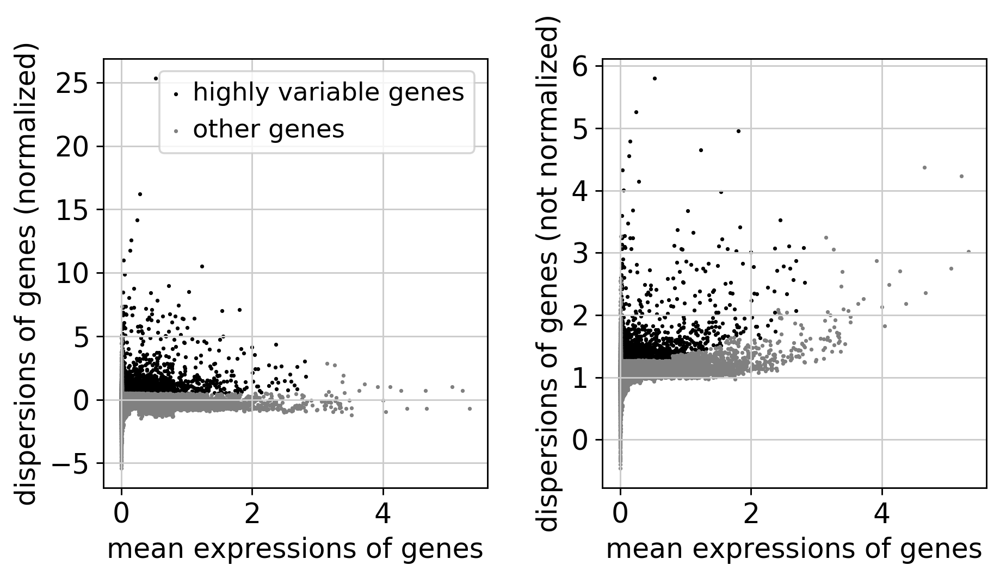

1728

In [4]:
#hvgs = adata_ko.var['highly_variable'].intersection(adata_wt.var['highly_variable'])
sc.pp.highly_variable_genes(ko, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(ko)
np.sum(ko.var['highly_variable'])

In [5]:
sc.pp.scale(ko, max_value=10)

In [6]:
sc.tl.pca(ko, svd_solver='arpack')

computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:01)


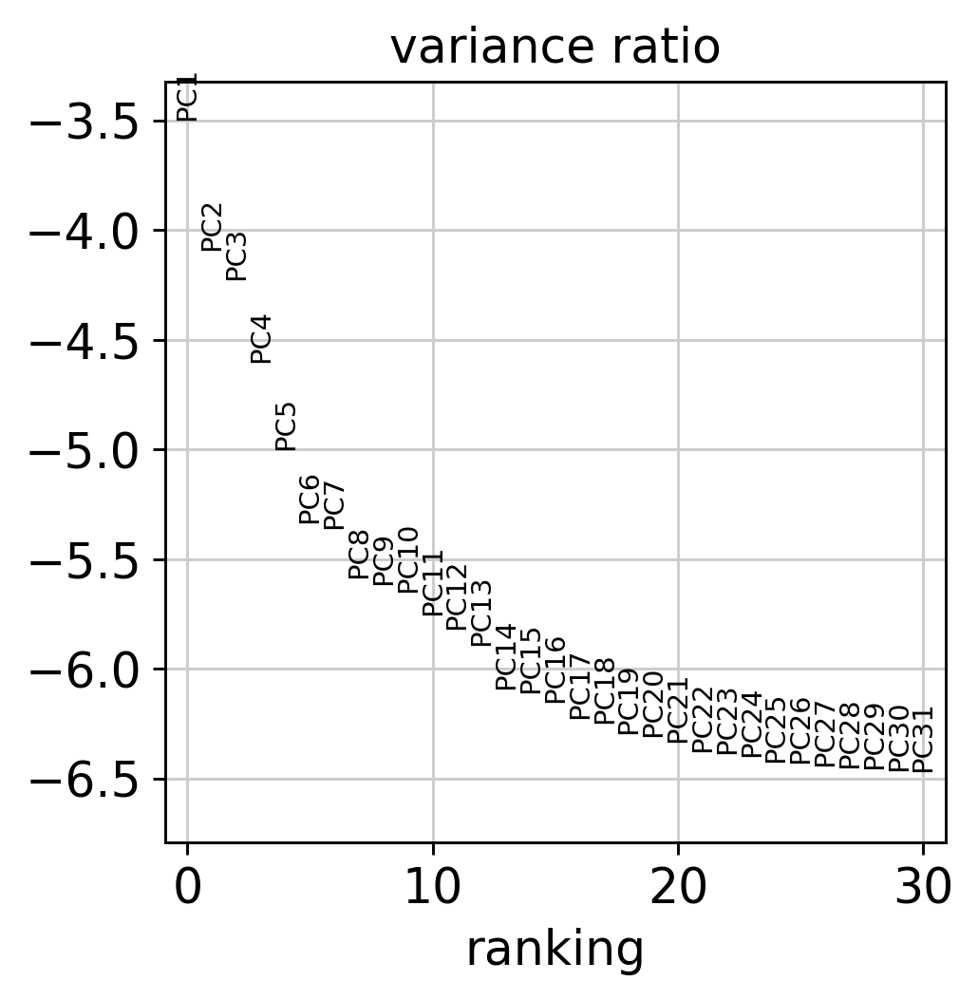

In [7]:
sc.pl.pca_variance_ratio(ko, log=True)

In [8]:
sc.pp.neighbors(ko)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:03)


In [9]:
sc.tl.umap(ko)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 12 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


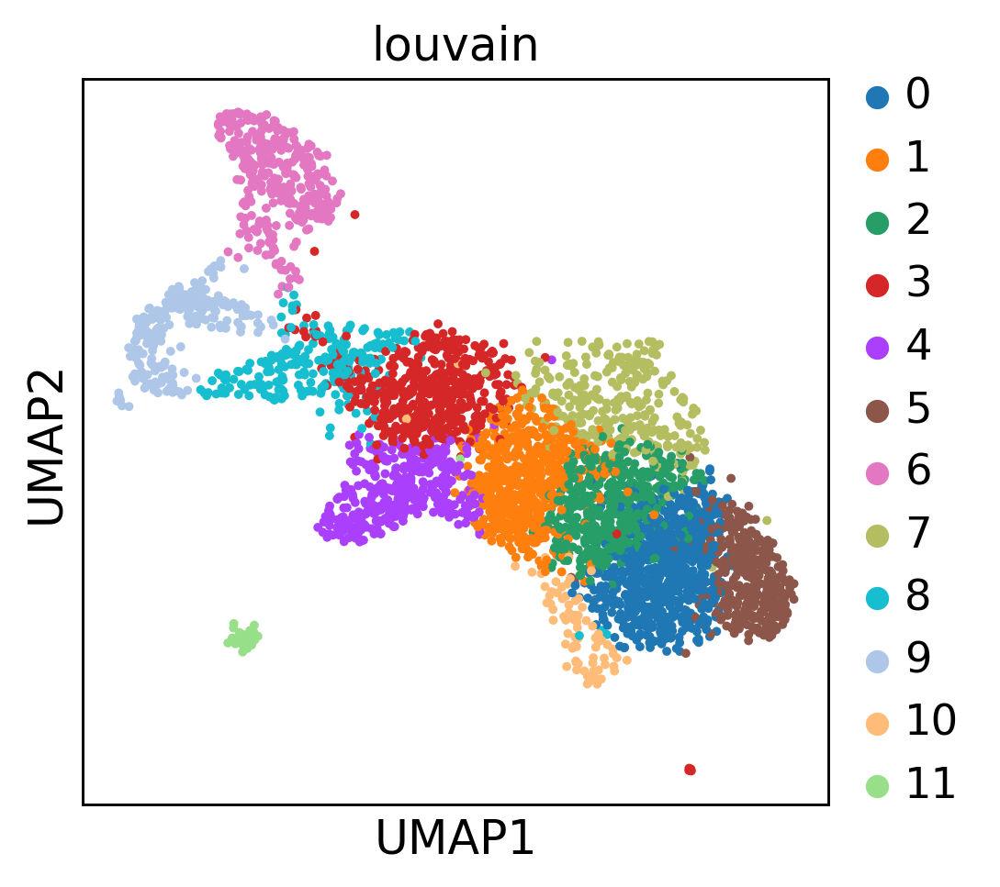

In [58]:
sc.tl.louvain(ko, resolution=1.2)
sc.pl.umap(ko, color=['louvain'])

In [59]:
mean_cellType = np.empty((len(ko.obs['louvain'].unique()), ko.raw.shape[1]), 
                           dtype=float, order='C')

In [60]:
raw_adata = ko.raw.X.toarray()

In [61]:
for i in range(0, len(ko.obs['louvain'].unique())):
    #print(adata.obs['phenograph'].unique()[i])
    mean_cellType[i,:] = np.mean(raw_adata[ko.obs['louvain'] == ko.obs['louvain'].unique()[i], :], axis = 0)

In [62]:
mean_df = pd.DataFrame(np.corrcoef(mean_cellType), index = ko.obs['louvain'].unique(), columns = ko.obs['louvain'].unique())

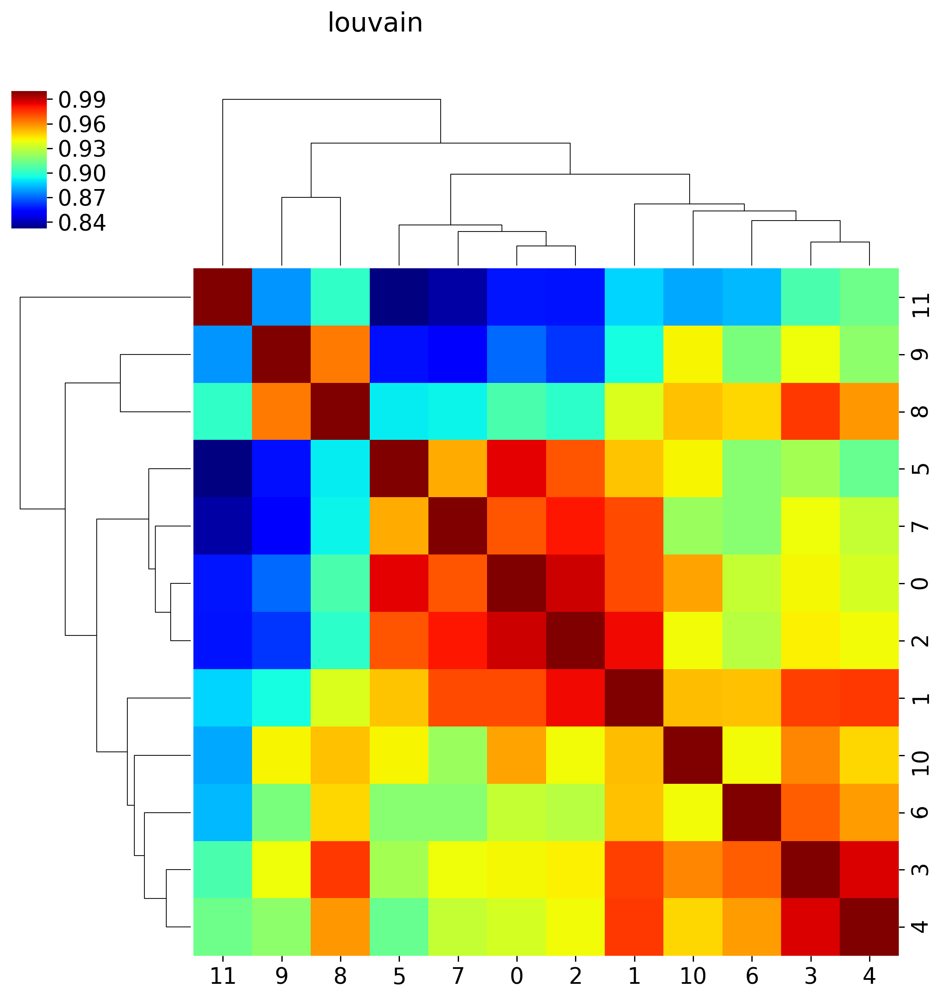

In [63]:
import seaborn
ax = seaborn.clustermap(mean_df, cmap="jet").fig.suptitle('louvain') 

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:12)


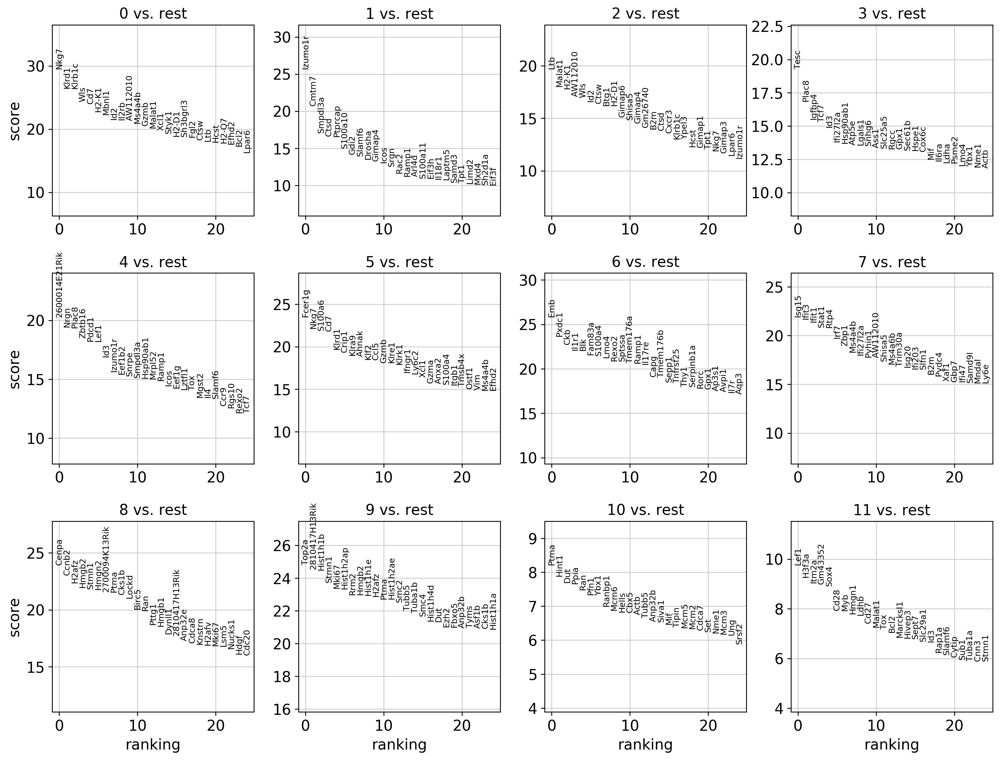

In [64]:
sc.tl.rank_genes_groups(ko, 'louvain', method='wilcoxon')
sc.pl.rank_genes_groups(ko, n_genes=25, sharey=False)

In [65]:
pd.DataFrame(ko.uns['rank_genes_groups']['names']).head(50)

,0,1,2,3,4,5,6,7,8,9,10,11
0,Nkg7,Izumo1r,Ltb,Tesc,2600014E21Rik,Fcer1g,Emb,Isg15,Cenpa,Top2a,Ptma,Lef1
1,Klrd1,Cmtm7,Malat1,Plac8,Nrgn,Nkg7,Pxdc1,Ifit3,Ccnb2,2810417H13Rik,Hint1,H3f3a
2,Klrb1c,Smpdl3a,H2-K1,Igfbp4,Plac8,S100a6,Ckb,Ifit1,H2afz,Hist1h1b,Dut,Itm2a
3,Wls,Ctsd,AW112010,Tcf7,Zbtb16,Cd7,Il1r1,Stat1,Hmgb2,Stmn1,Ppia,Gm43352
4,Cd7,Ptprcap,Wls,Id3,Pdcd1,Klrd1,Blk,Rtp4,Stmn1,Mki67,Ran,Sox4
5,H2-K1,S100a10,Id2,Ifi27l2a,Lef1,Crip1,Fam83a,Irf7,Hmgn2,Hist1h2ap,Pfn1,Cd28
6,Mbnl1,Gdi2,Ctsw,Hsp90ab1,Id3,Klra9,S100a4,Zbp1,2700094K13Rik,Rrm2,Ybx1,Myb
7,Id2,Slamf6,Btg1,Atp5e,Izumo1r,Ahnak,Lmo4,Ms4a4b,Ptma,Hmgb2,Ranbp1,Hmgn1
8,Il2rb,Drosha,H2-D1,Lgals1,Eef1b2,Klf2,Rexo2,Ifi27l2a,Cks1b,Hist1h1e,Mcm6,Ldhb
9,AW112010,Gimap4,Gimap6,Snhg6,Snrpe,Ccl5,Sptssa,Pyhin1,Lockd,H2afz,Hells,Cd27


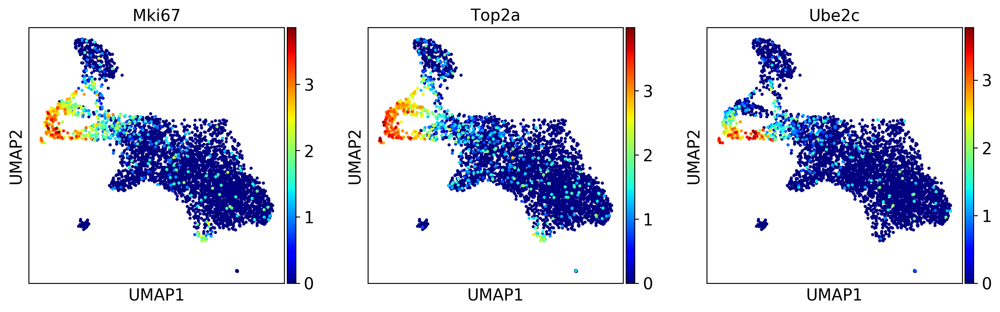

In [19]:
sc.pl.umap(ko, color=['Mki67', 'Top2a', 'Ube2c'], color_map="jet") # Cycling

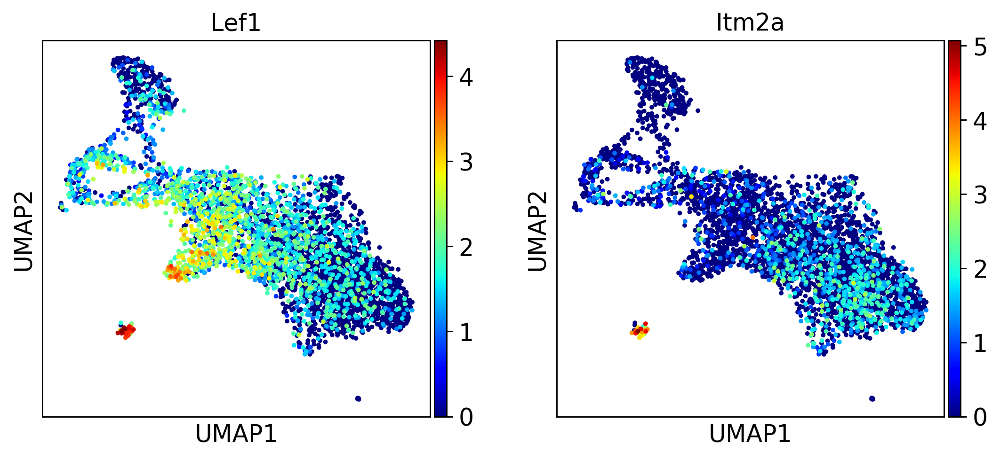

In [20]:
sc.pl.umap(ko, color=['Lef1','Itm2a'], color_map="jet") # NKT0

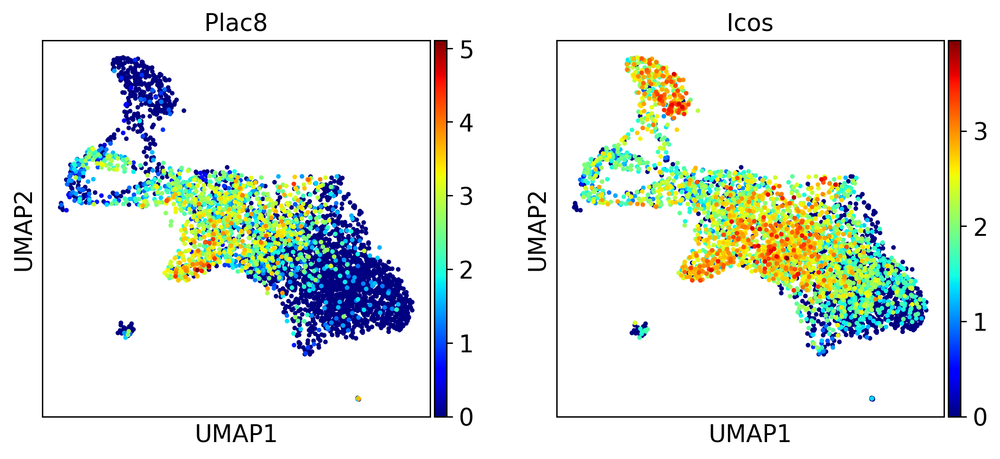

In [21]:
sc.pl.umap(ko, color=['Plac8','Icos'], color_map="jet") # NKT2

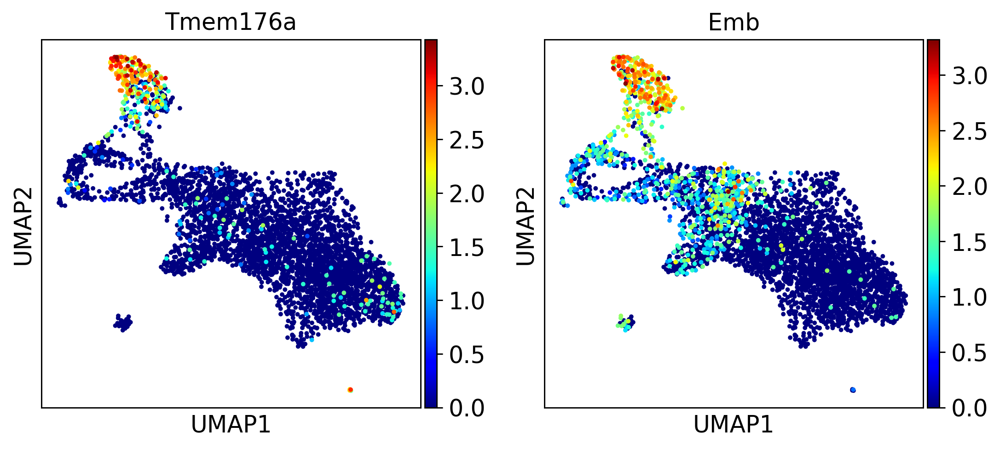

In [22]:
sc.pl.umap(ko, color=['Tmem176a', 'Emb'], color_map="jet") # NKT17

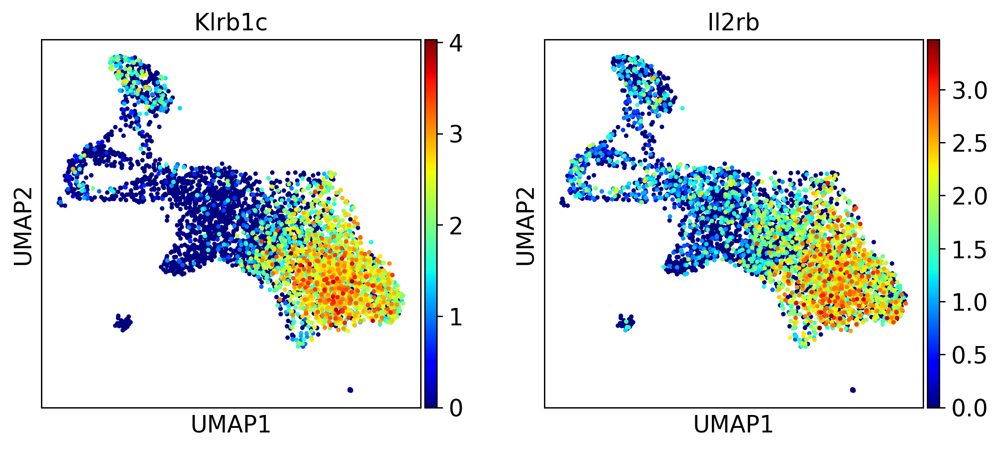

In [23]:
sc.pl.umap(ko, color=['Klrb1c','Il2rb'], color_map="jet") # NKT1

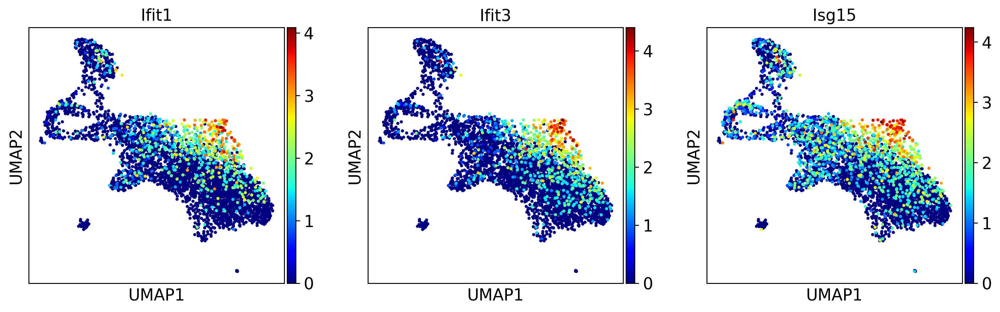

In [24]:
sc.pl.umap(ko, color=['Ifit1','Ifit3','Isg15'], color_map="jet") # NKT1d

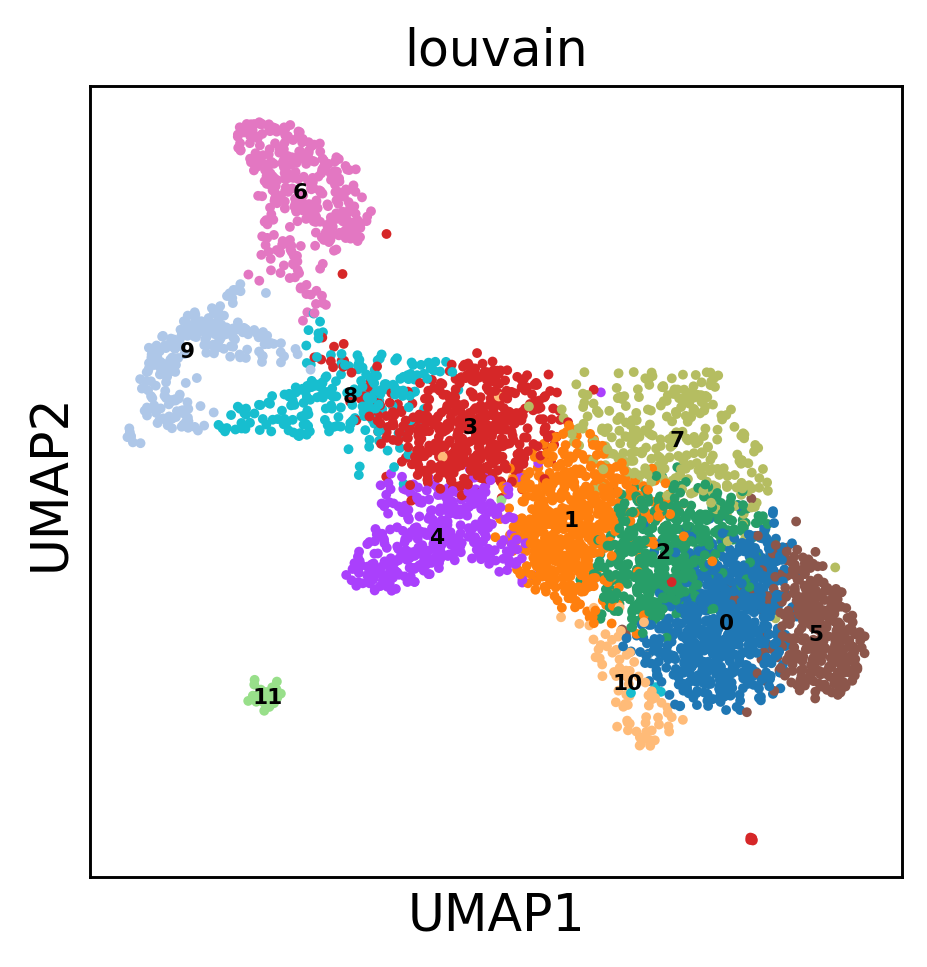

In [66]:
sc.pl.umap(ko, color=['louvain'], legend_loc = 'on data', legend_fontsize = 6)

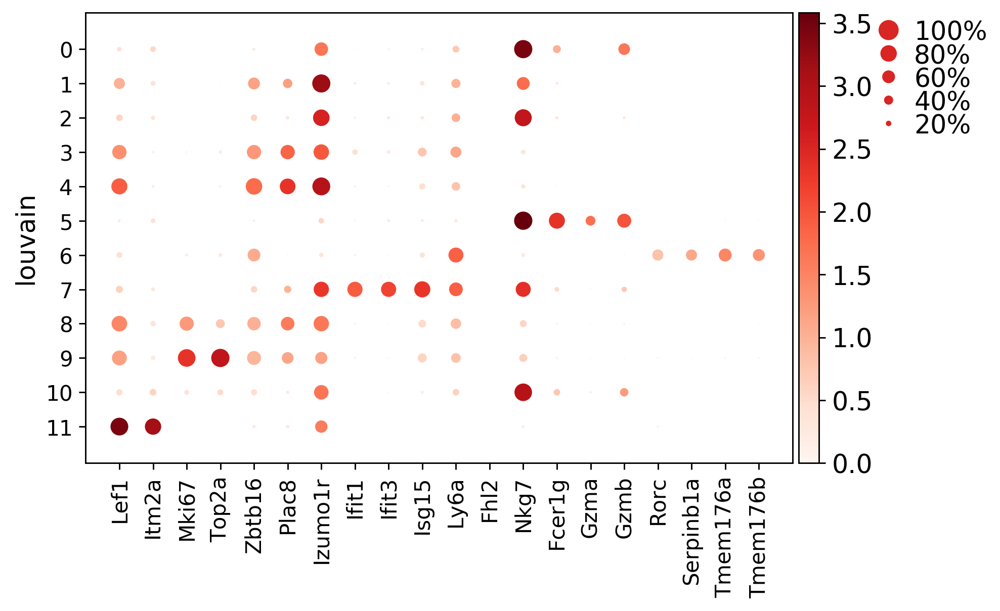

In [67]:
marker_genes = ['Lef1','Itm2a','Mki67','Top2a','Zbtb16','Plac8','Izumo1r','Ifit1','Ifit3','Isg15','Ly6a','Fhl2','Nkg7','Fcer1g','Gzma','Gzmb','Rorc','Serpinb1a','Tmem176a','Tmem176b']
ax = sc.pl.dotplot(ko, marker_genes, groupby='louvain')

In [72]:
new_cluster_names = {
    '0':'NKT1b', '1':'NKT2b', '2':'NKT1b', '3':'NKT2a', '4':'NKT2a',
    '5':'NKT1c','6':'NKT17', '7':'NKT1d', '8':'Cycling NKT', '9':'Cycling NKT',
    '10':'NKT1b', '11':'NKT0'}


In [73]:
vect = []
for i in range(0, len(ko.obs['louvain'])):
    vect = vect + [new_cluster_names[str(ko.obs['louvain'][i])]]
    
ko.obs['cell_type'] = vect

... storing 'cell_type' as categorical


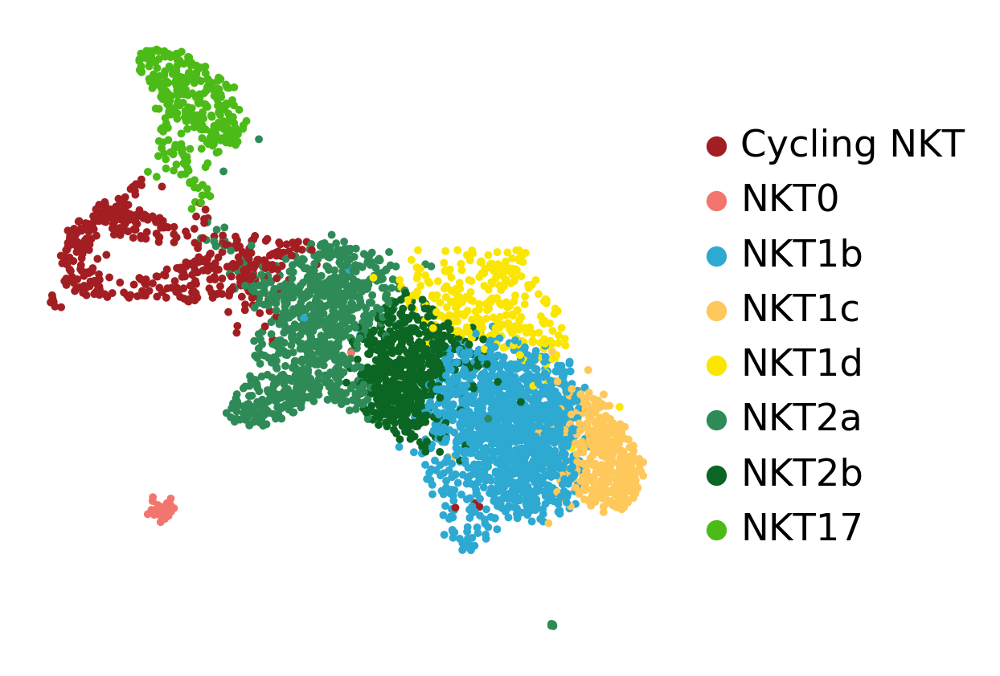

In [74]:
sc.pl.umap(ko, color='cell_type', title='', frameon=False)

In [75]:
ko.obs['cell_type'].cat.categories
ko.obs['cell_type'].cat.reorder_categories(['NKT0','Cycling NKT','NKT17','NKT2a','NKT2b','NKT1b','NKT1c','NKT1d'], inplace = True)
ko.uns['cell_type_colors'] = [ '#A31E22', # NKT0
                                '#F3766E', # Cycling NKT 
                                '#2da9d2', # NKT17
                                '#FEC85A', # NKT2a
                                '#FAE600', # NKT2b
                                #'#50C878', # NKT1a
                                '#2E8B57', # NKT1b
                                '#0B6623', # NKT1c
                                '#4CBB17'] # NKT1d

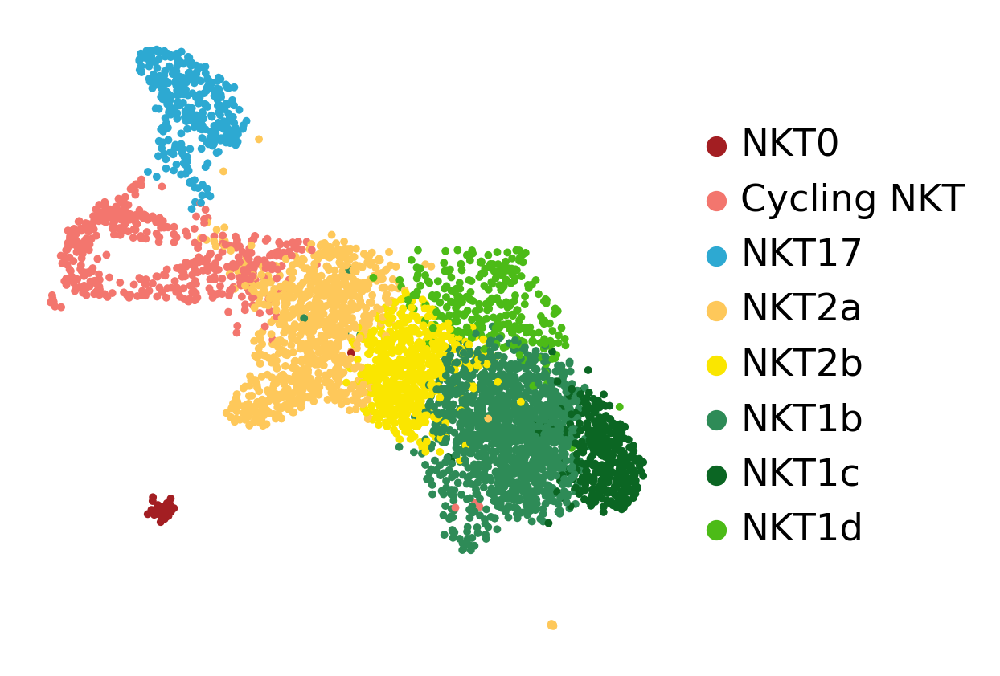

In [76]:
sc.pl.umap(ko, color='cell_type', title='', frameon=False, save='_ko.ann.pdf')

In [77]:
ko.shape

(4068, 13720)

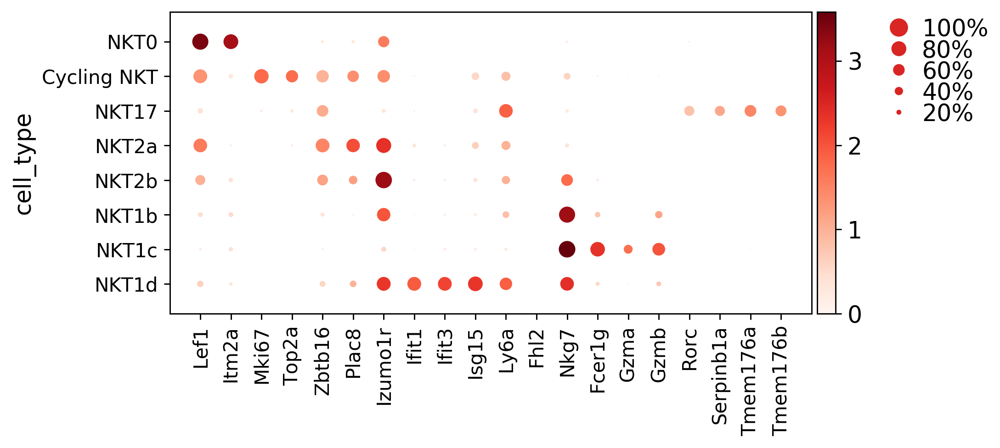

In [78]:
marker_genes = ['Lef1','Itm2a','Mki67','Top2a','Zbtb16','Plac8','Izumo1r','Ifit1','Ifit3','Isg15','Ly6a','Fhl2','Nkg7','Fcer1g','Gzma','Gzmb','Rorc','Serpinb1a','Tmem176a','Tmem176b']
ax = sc.pl.dotplot(ko, marker_genes, groupby='cell_type')

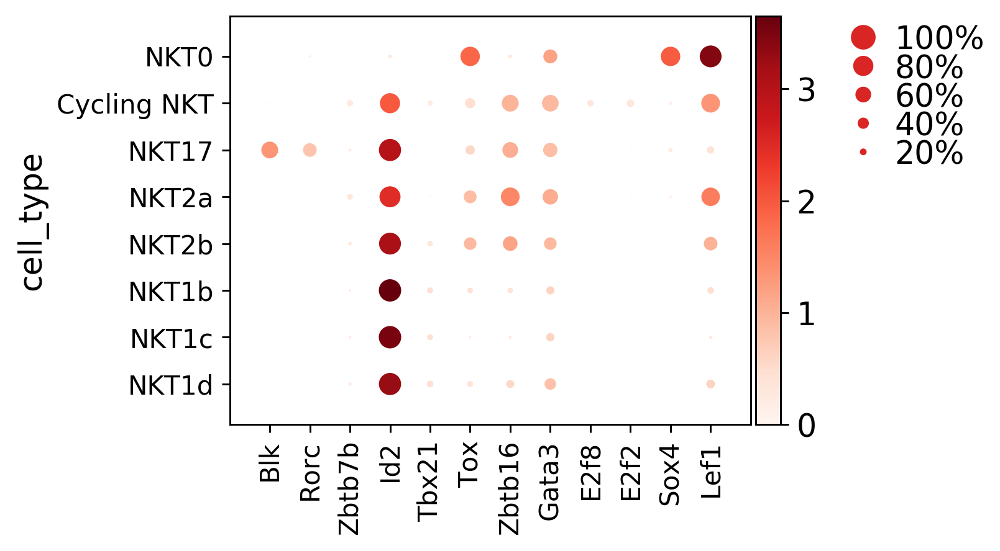

In [79]:
marker_genes = ['Blk', 'Rorc', 'Zbtb7b', 'Id2', 'Tbx21', 'Tox', 'Zbtb16', 'Gata3', 'E2f8', 'E2f2', 'Sox4','Lef1']
ax = sc.pl.dotplot(ko, marker_genes, groupby='cell_type')

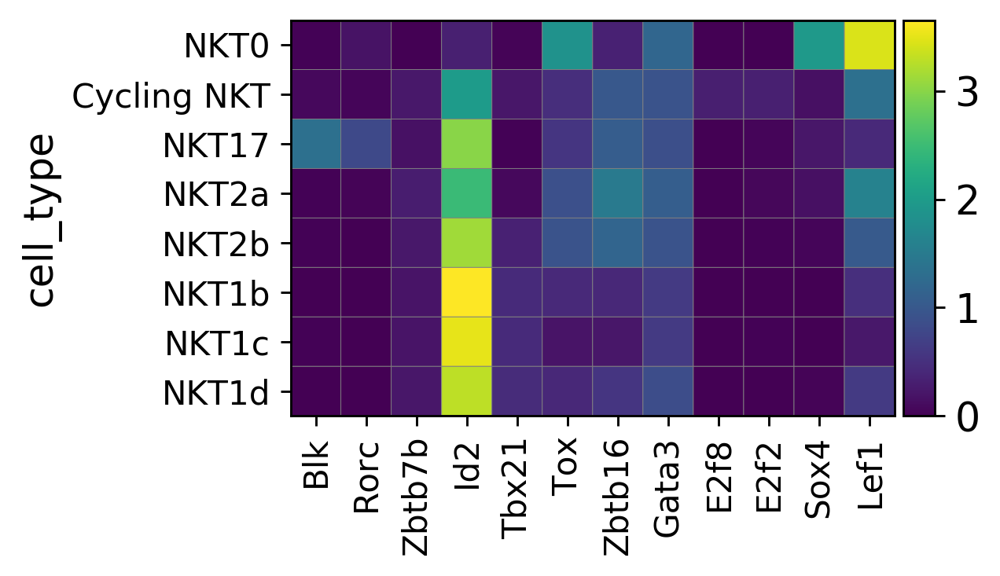

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[3.84, 0, 0.2])

In [80]:
sc.pl.matrixplot(ko, marker_genes, groupby='cell_type')

In [81]:
ko.write('./output/ko.ann.h5ad')

# Saving cellbrowser

In [82]:
ko.obs['umap_1'] = pd.DataFrame(ko.obsm['X_umap']).iloc[:,0].tolist()
ko.obs['umap_2'] = pd.DataFrame(ko.obsm['X_umap']).iloc[:,1].tolist()
ko.obs.to_csv(path_or_buf = 'output/metadata.ko.tsv', sep = '\t', index = True)

sc.external.exporting.cellbrowser(ko, 
                                 'cellbrowser/ko', 
                                 'ko', 
                                  annot_keys=['cell_type', 'louvain', 'sample', 
                                              'n_counts', 'n_genes', 'percent_mito', 'percent_ribo'], 
                                 cluster_field='cell_type', nb_marker=30,
                                 skip_matrix=False, do_debug=True)

INFO:root:Writing scanpy matrix (4068 cells, 13720 genes) to cellbrowser/ko/exprMatrix.tsv.gz
INFO:root:Transposing matrix
INFO:root:Writing gene-by-gene, without using pandas
INFO:root:Writing 13720 genes in total
INFO:root:Wrote 0 genes
INFO:root:Wrote 2000 genes
INFO:root:Wrote 4000 genes
INFO:root:Wrote 6000 genes
INFO:root:Wrote 8000 genes
INFO:root:Wrote 10000 genes
INFO:root:Wrote 12000 genes
DEBUG:root:Compressing cellbrowser/ko/exprMatrix.tsv.gz.tmp
DEBUG:root:Running gzip -f cellbrowser/ko/exprMatrix.tsv.gz.tmp
DEBUG:root:Renaming cellbrowser/ko/exprMatrix.tsv.gz.tmp.gz to cellbrowser/ko/exprMatrix.tsv.gz
DEBUG:root:Couldnt find coordinates for ForceAtlas2, tried keys fa, X_fa and X_draw_graph_fa
DEBUG:root:Couldnt find coordinates for Fruchterman Reingold, tried keys fr, X_fr and X_draw_graph_fr
DEBUG:root:Couldnt find coordinates for Grid Fruchterman Reingold, tried keys grid_fr, X_grid_fr and X_draw_graph_grid_fr
DEBUG:root:Couldnt find coordinates for Kamadi Kawai, tried 

# Cycling cells

In [83]:
adata_ann = sc.read_h5ad('./output/ko.ann.h5ad')
adata_raw = sc.read_h5ad('./output/ko.preprocessing.h5ad')
adata_raw.shape

(4068, 13720)

In [84]:
tokeep = []

for x in adata_ann.obs['cell_type']:
    tokeep = tokeep + [x in ['Cycling NKT']]

#keep_cells = adata_ann.obs['cell_type'] == ['Cycling NKT']
list_of_cell_names = adata_ann.obs_names[tokeep]
adata_cc = adata_raw[list_of_cell_names, ]
adata_cc.obs['cell_type'] = adata_ann.obs['cell_type'] 
adata_cc.shape

Trying to set attribute `.obs` of view, copying.


(455, 13720)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


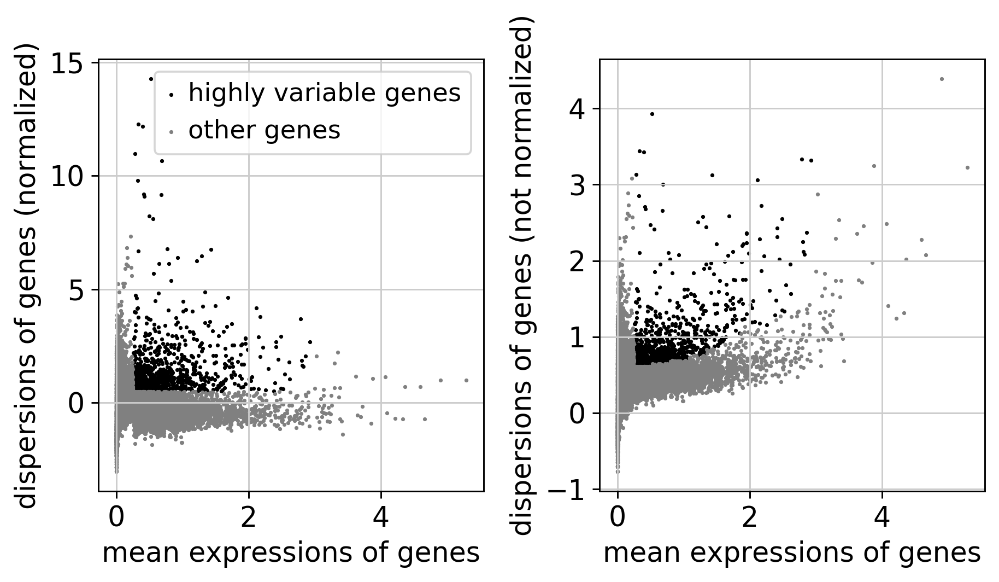

956

In [85]:
sc.pp.highly_variable_genes(adata_cc, min_mean=0.25, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata_cc)
np.sum(adata_cc.var['highly_variable'])

In [86]:
sc.pp.scale(adata_cc, max_value=10)

In [87]:
sc.tl.pca(adata_cc, svd_solver='arpack')

computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)


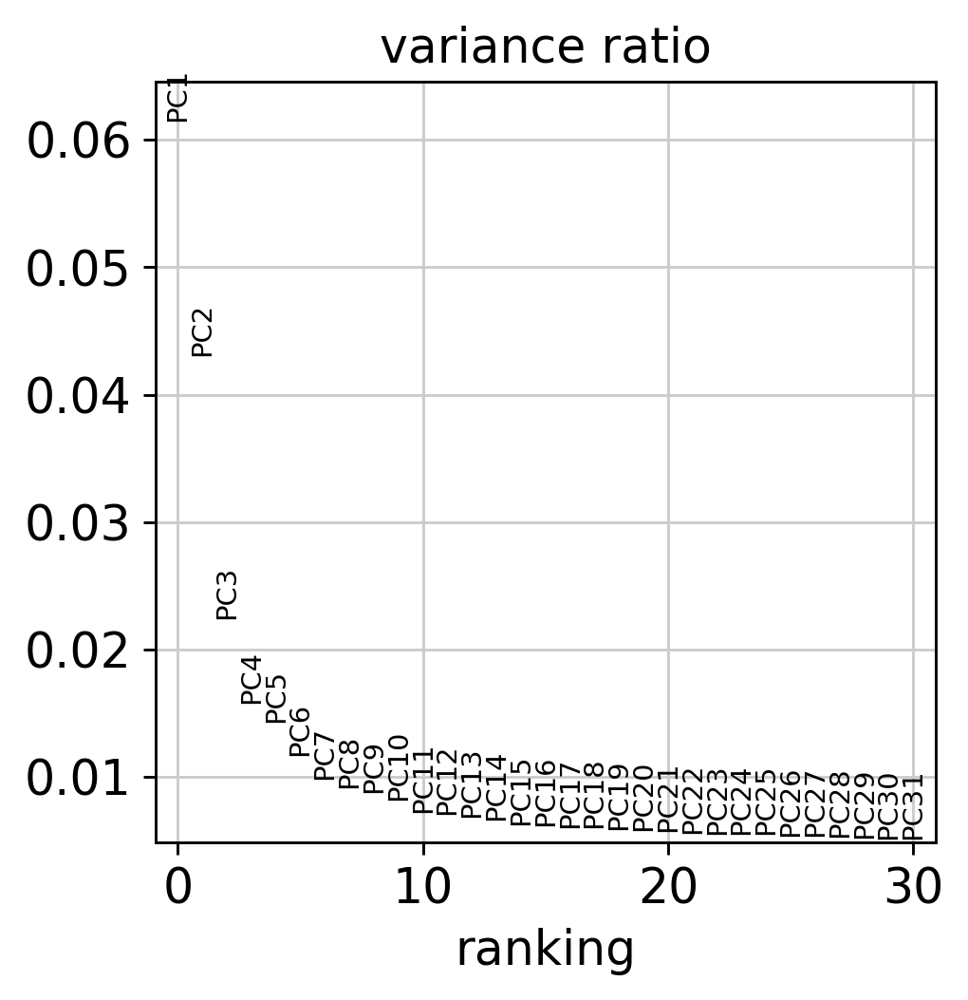

In [88]:
sc.pl.pca_variance_ratio(adata_cc)# log = True

In [89]:
sc.pl.pca_loadings(adata_cc, components=list(range(0,7)))

ERROR: Component indices must be greater than zero.


In [90]:
sc.pp.neighbors(adata_cc)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)


In [91]:
sc.tl.umap(adata_cc)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


In [92]:
# cell cycle scoring
cell_cycle_genes = [x.strip() for x in open('/data/10x_data/cell_cycle_vignette_files/regev_lab_cell_cycle_genes_mouse.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata_cc.var_names]
sc.tl.score_genes_cell_cycle(adata_cc, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs) (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs) (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


... storing 'phase' as categorical


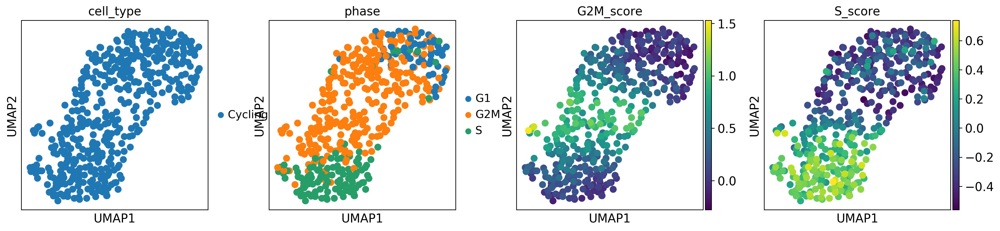

In [93]:
sc.pl.umap(adata_cc, color=['cell_type','phase','G2M_score','S_score'], edges = False)

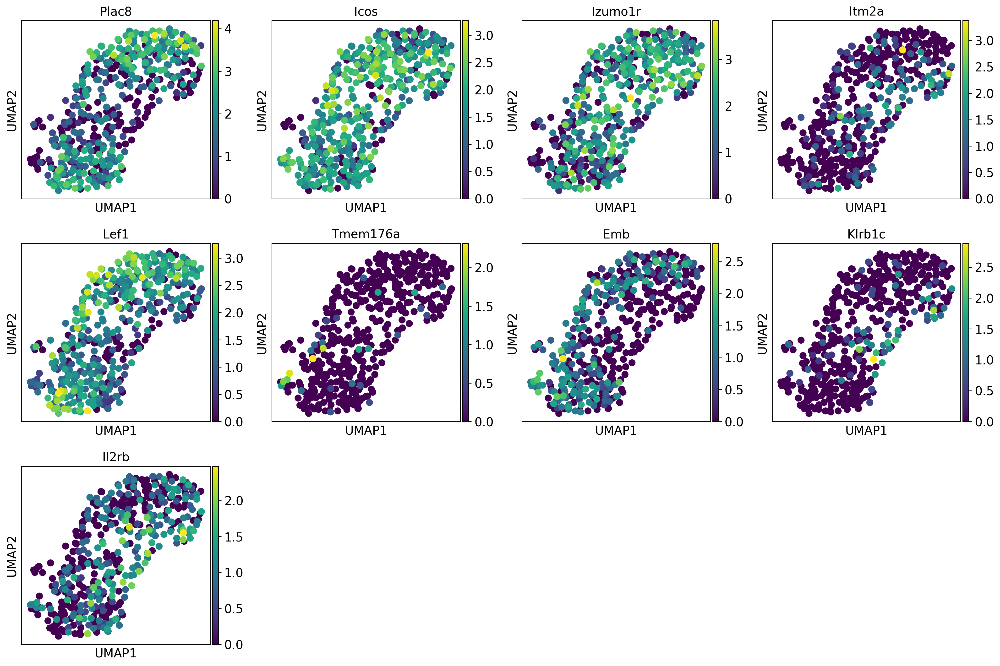

In [94]:
sc.pl.umap(adata_cc, color=['Plac8','Icos','Izumo1r','Itm2a','Lef1','Tmem176a','Emb','Klrb1c','Il2rb'], edges = False)